
# - CardioLife -
#### A predictive model that forecasts the risk of having a cardiovascular disease based on different factors and displays recommendations on minimizing the risk.  

#### Area of interest
According to the World Health Organization, cardiovascular diseases (CVD) are the leading cause of global death, representing between 31-32% of global deaths. 
The area of interest is the prevention of cardiovascular diseases, by predicting the risk of having a CVD and by making recommendations on how to minimize the risk. Therefore, we need to analyze what patients have or not a CVD, and identify the factors that lead to the apparition of CVD. 
#### Possible solutions: 
We can build different types of model, to compare the accuracy and to find the best model that will respond to our question: whenever a patient will have a CVD or not, how much the patient is on risk. Using the result of the prediction, we can then make recommendations on minimizing the risk of getting a CVD. 

#### Dataset: `cardio_dataset.csv`
`cardio_dataset.csv` is an open source dataset from Kaggle.com, named: 'Cardiovascular Disease dataset`, that contains 70,000 records of patients. There are three types of information about patients:
* Personal- includes personal data of the patients (age, height, weight, etc.)
* Medical- includes data from medical examinations (blood pressure, cholesterol, etc.)
* Lifestyle- includes lifestyle data of patients (if they smoke, if they are active) 

Data dictionary:
1. ID - a unique id number for each patient (type: float64)
2. Age - age of the patient, in days (type: float64)
2. Gender - the gender of the patient: 1-female, 2-male (type: int64)
3. Height - the height of the patient in cm (type: float64)
4. Weight - the weight of the patient in kg (type: float64)
5. Systolic blood pressure (`ap_hi`) - the systolic blood pressure of the patient (type: float64)
6. Diastolic blood pressure (`ap_lo`) - the diastolic blood pressure of the patient (type: float64)
7. Cholesterol - the level of the cholesterol in the blood: 1-normal, 2-above normal, 3-well above normal (type: int64)
8. Glucose (`gluc`) - the level of glucose in the blood: 1-normal, 2-above normal, 3-well above normal (type: int64)
9. Smoking (`smoke`) - if the patient is smoking: 0- no, 1-yes (type: int64)
10. Alcohol (`alco`) - if the patient is drinking alcohol: 0-no, 1-yes (type: int64)
11. Active - if the patient is active or sedentary: 0-it's not active, 1- is active (type: int64)
12. Cardio - if the patient has a cardiovascular disease: 0-no, 1-yes (type: int64)
 

#### Plan of action:
1. Basic analysis and cleaning of the dataset
2. Exploratory Data Analysis
3. Initial patern discoveries
4. Further stepts

### 1. Basic analysis and cleaning of the dataset
We can import all the libraries that we will need in the future, load our dataset and have a look at our data.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
cardio_df = pd.read_csv('/Users/vioreliamagari/Desktop/capstone_may2024/data/cardio_dataset.csv', delimiter=';')
cardio_df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [3]:
cardio_df.info()

shape = cardio_df.shape
print(f'The shape of the dataset is: {shape}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB
The shape of the dataset is: (70000, 13)


We see that the dataset contains only values in numbers, and the types of columns are int64 or float64. Nevertheless, we know that the columns `gender`, `cholesterol`, `gluc`, `smoke`, `alco`, `active` and `cardio` are cathegorical. Also, we observe that there are 70,000 rows and 13 columns and there is no null values.  

In [4]:
#check if there is null values
nulls = cardio_df.isna().sum().sum()
print(f'We have in total: {nulls} null values')
#check if there is duplicated values
duplicates = cardio_df.duplicated().sum()
print(f'We have: {duplicates} duplicated values')

We have in total: 0 null values
We have: 0 duplicated values


Therefore, we can confirm that the dataset does not have null and duplicated values.   

#### Cleaning data
As we saw abose that we don't have null and duplicated values, let's check if we have invalid or strange values. We need to make sure that our data is relevant. 

**Checking the cathegorical columns**

First of all, let's see what values have categorical columns, by counting their values:

In [5]:
#check `gender` column
cardio_df['gender'].value_counts()

gender
1    45530
2    24470
Name: count, dtype: int64

In [6]:
#check `cholesterol` column
cardio_df['cholesterol'].value_counts()

cholesterol
1    52385
2     9549
3     8066
Name: count, dtype: int64

In [7]:
#check `gluc` column
cardio_df['gluc'].value_counts()

gluc
1    59479
3     5331
2     5190
Name: count, dtype: int64

In [8]:
#check `smoke` column
cardio_df['smoke'].value_counts()

smoke
0    63831
1     6169
Name: count, dtype: int64

In [9]:
#check `alco` column
cardio_df['alco'].value_counts()

alco
0    66236
1     3764
Name: count, dtype: int64

In [10]:
#check `active` column
cardio_df['active'].value_counts()

active
1    56261
0    13739
Name: count, dtype: int64

In [11]:
#check `cardio` column
cardio_df['cardio'].value_counts()

cardio
0    35021
1    34979
Name: count, dtype: int64

Therefore, we can confirm that the data from the categorical columns is relevant. 
Now let's check the data from **numerical columns**: 

**Checking Age**

We can check the values for the `age` column, by looking at the minimum and maximum value in years:

In [12]:
#find maxim and minim age
max_age = cardio_df['age'].max()
min_age = cardio_df['age'].min()
#convert the age from days to years
max_age_years = int(max_age / 365.25) 
min_age_years = int(min_age / 365.25)
#print 
print('Maximum age is: ', max_age_years)
print('Minimum age is: ', min_age_years)

Maximum age is:  64
Minimum age is:  29


Therefore, `age` column has appropriate values. The minimum age of the patients is 29 years and the maximum age is 64. 

**Checking blood pressure**

Now let's check if the blood pressure has the right values. There is some cases when the blood pressure can be as high as 200 mmHg. But in history there were cases when the blood pressure went up high to 380 mmHg. So we can consider that the blood pressure that is more than 400mmHg is invalid/ incorrect. Also, a negative blood pressure value is also invalid. 

Therefore, we will consider a relevant systolic blood pressure between 0 and 400 mmHg, and a relevant diastolic blood pressure between 0 and 200 mmHg.

In [13]:
#check if there is invalid ap_hi
condition_aphi = (cardio_df['ap_hi'] > 400) | (cardio_df['ap_hi'] < 0)
invalid_aphi = condition_aphi.value_counts()
print(invalid_aphi)

ap_hi
False    69954
True        46
Name: count, dtype: int64


In [14]:
#check if there is invalid ap_lo
condition_aplo = (cardio_df['ap_lo'] > 200) | (cardio_df['ap_lo'] < 0)
invalid_aplo = condition_aplo.value_counts()
print(invalid_aplo)

ap_lo
False    69046
True       954
Name: count, dtype: int64


The total of invalid values is 1000 and represents 1,43% of our data. Therefore, it will be the best, for now, to drop the rows that contains invalid values of blood pressure, because it will have a bad influence on our model. 

In [15]:
#drop invalid ap_hi and ap_lo
cardio_df.drop(cardio_df[condition_aphi].index, inplace = True)
cardio_df.drop(cardio_df[condition_aplo].index, inplace = True)

/var/folders/n9/ykzpcl3n1wg9hcrjmg_6qw440000gn/T/ipykernel_1580/4016276580.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cardio_df.drop(cardio_df[condition_aplo].index, inplace = True)


Now, let's check if the rows was really dropped: 

In [16]:
#check if there is invalid ap_hi
condition_aphi = (cardio_df['ap_hi'] > 400) | (cardio_df['ap_hi'] < 0)
invalid_aphi = condition_aphi.value_counts()
print(invalid_aphi)
#check if there is invalid ap_lo
condition_aplo = (cardio_df['ap_lo'] > 200) | (cardio_df['ap_lo'] < 0)
invalid_aplo = condition_aplo.value_counts()
print(invalid_aplo)


ap_hi
False    69000
Name: count, dtype: int64
ap_lo
False    69000
Name: count, dtype: int64


**Checking height**

We can check the height, by looking at the minimum and maximum height, and see if the data is relevant: 

In [17]:
#find minim and maxim height
max_height = cardio_df['height'].max()
min_height = cardio_df['height'].min()
#print them
print('Maximum height is: ', max_height)
print('Minimum height is: ', min_height)

Maximum height is:  250
Minimum height is:  55


Nowadays, the tallest person in world is 251 cm from Turkey, followed by 246 cm from Iran. Therefore, the patient who is 250 cm is not real. Also, the shortest person is 65.24 cm in Iran. So 55 cm is too short. Now, let's count, how many patients has an incorrect height, if we consider that the height should be minimum 130 cm and maximum 220cm: 

In [18]:
#check if there is invalid height
condition_height = (cardio_df['height'] < 130) | (cardio_df['height'] > 220)
invalid_height = condition_height.value_counts()
print(invalid_height)

height
False    68908
True        92
Name: count, dtype: int64


So, there is 92 patients that have incorrect height. That is 0.13% of our data and we can drop the rows that contains this patients: 


In [19]:
#drop invalid height
cardio_df.drop(cardio_df[condition_height].index, inplace = True)

Let's check if we did everything right: 

In [20]:
#check if there is invalid height
condition_height = (cardio_df['height'] < 100) | (cardio_df['height'] > 220)
invalid_height = condition_height.value_counts()
print(invalid_height)

height
False    68908
Name: count, dtype: int64


**Checking weight**

As we did for height, we will look at the minimum and maximum weight, and decide if there are wrong values:

In [21]:
#find the minimum and maximum weight
max_weight = cardio_df['weight'].max()
min_weight = cardio_df['weight'].min()
#print them
print('Maximum weight is: ', max_weight)
print('Minimum weight is: ', min_weight)

Maximum weight is:  200.0
Minimum weight is:  11.0


We see that the maximum value is relevant, but the minimum value is too small. We can consider, that the patients should have the weight more than 30 kg. Let's count how many patients don't meet the condition:

In [22]:
#check if there is invalid values
condition_weight = (cardio_df['weight'] < 30)
invalid_weight = condition_weight.value_counts()
print(invalid_weight)

weight
False    68903
True         5
Name: count, dtype: int64


Therefore, there are 6 patients with the weight less than 30 kg. That is 0.009% of our data, so we can drop this rows:

In [23]:
#drop invalid values
cardio_df.drop(cardio_df[condition_weight].index, inplace = True)

Let's check if we deleted the rows:

In [24]:
#check if there is invalid values
condition_weight = (cardio_df['weight'] < 30)
invalid_weight = condition_weight.value_counts()
print(invalid_weight)

weight
False    68903
Name: count, dtype: int64


Therefore, we deleted 1.57% of the data that was invalid, and now we have 68903 patients with relevant values.


**Mapping `gender`**

Now, let's look at the gender:

In [25]:
#check `gender` column
cardio_df['gender'].value_counts()

gender
1    44879
2    24024
Name: count, dtype: int64

We can see that the `gender` column has values: 1 and 2. I think that the most convinient will be if `gender` is a binary column, as other columns that we have, so we won't be confused in the future. Therefore, we can map 1 to 0 for female, and 2 to 1 for male. 

Now, we can binary encode the column `gender`, mapping 1 to 0 (for female) and 2 to 1 (for male) and add it to the clean dataframe.

In [26]:
#Mapping gender from 2 to 1 and 1 to 0
cardio_df['gender'] = np.where(cardio_df["gender"] == 2, 1, 0)
#check
cardio_df['gender'].value_counts()

gender
0    44879
1    24024
Name: count, dtype: int64

**Adding Body Mass Index**

The Body Mass Index (BMI) is a very important feature, that may discover many useful insights. Therefore, we can calculate the Body Mass Index by dividing the weight in kilograms with the square of height in meters. 
The interpretation of BMI:
| **BMI**        | **Weight status** |
|----------------|-------------------|
| Below 18.5     | Underweight       |
| 18.5 – 24.9    | Healthy Weight    |
| 25.0 – 29.9    | Overweight        |
| 30.0 and Above | Obesity           |

In [37]:
#create a new column for BMI
cardio_df['bmi'] = (cardio_df['weight'] / ((cardio_df['height'] / 100) ** 2))

Now, let's look again at our data:

In [38]:
#check
cardio_df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,0,18393,1,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,1,20228,0,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,2,18857,0,165,64.0,130,70,3,1,0,0,0,1,23.507805
3,3,17623,1,169,82.0,150,100,1,1,0,0,1,1,28.710479
4,4,17474,0,156,56.0,100,60,1,1,0,0,0,0,23.011177


In [39]:
cardio_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68903 entries, 0 to 69999
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           68903 non-null  int64  
 1   age          68903 non-null  int64  
 2   gender       68903 non-null  int64  
 3   height       68903 non-null  int64  
 4   weight       68903 non-null  float64
 5   ap_hi        68903 non-null  int64  
 6   ap_lo        68903 non-null  int64  
 7   cholesterol  68903 non-null  int64  
 8   gluc         68903 non-null  int64  
 9   smoke        68903 non-null  int64  
 10  alco         68903 non-null  int64  
 11  active       68903 non-null  int64  
 12  cardio       68903 non-null  int64  
 13  bmi          68903 non-null  float64
dtypes: float64(2), int64(12)
memory usage: 7.9 MB


Now we can save this dataframe, so we can use it in the future:

In [40]:
#save cleaned cardio_df 
cardio_df.to_csv('cardio_ds.csv', index=False)

Therefore, we cleaned our dataset, and now we can proceed to do some Exploratory Data Analysis. 

### 2. Exploratory Data Analysis

In my opinion, to do some clear visualization, is better if we create a copy of our data frame, designated for visualizations, and make some changes to our categorical columns, so we can reed them easily. Also, we can convert the age of patients from days to years. 

In [42]:
#create a copy of cardio_df, exclude ID
cardio_visual = cardio_df.iloc[:, 1:].copy()
#transform the age from days to years
cardio_visual['age'] = (cardio_df['age'] / 365.25).astype(int)
#transform the categorical columns:
cardio_visual['gender'] = np.where(cardio_visual['gender'] == 1, 'male', 'female')
cardio_visual['cholesterol'] = cardio_visual['cholesterol'].map({1: 'normal', 2: 'above normal', 3: 'well above normal'})
cardio_visual['gluc'] = cardio_visual['gluc'].map({1: 'normal', 2: 'above normal', 3: 'well above normal'})
cardio_visual['smoke'] = np.where(cardio_visual['smoke'] == 0, 'no', 'yes')
cardio_visual['alco'] = np.where(cardio_visual['alco'] == 0, 'no', 'yes')
cardio_visual['active'] = np.where(cardio_visual['active'] == 0, 'no', 'yes')
cardio_visual['cardio'] = np.where(cardio_visual['cardio'] == 0, 'no', 'yes')
#check
cardio_visual.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,50,male,168,62.0,110,80,normal,normal,no,no,yes,no,21.967120
1,55,female,156,85.0,140,90,well above normal,normal,no,no,yes,yes,34.927679
2,51,female,165,64.0,130,70,well above normal,normal,no,no,no,yes,23.507805
3,48,male,169,82.0,150,100,normal,normal,no,no,yes,yes,28.710479
4,47,female,156,56.0,100,60,normal,normal,no,no,no,no,23.011177


Now, we can easily understand what each value means. 

##### **Distribution of categorical values**

First of all, we can look at the distribution of categorical values: 

In [30]:
# Create a dataframe for only categorical variables
categorical_df = cardio_visual.select_dtypes('object').copy()
# Check the dataframe
categorical_df.head()

,gender,cholesterol,gluc,smoke,alco,active,cardio
0,male,normal,normal,no,no,yes,no
1,female,well above normal,normal,no,no,yes,yes
2,female,well above normal,normal,no,no,no,yes
3,male,normal,normal,no,no,yes,yes
4,female,normal,normal,no,no,no,no


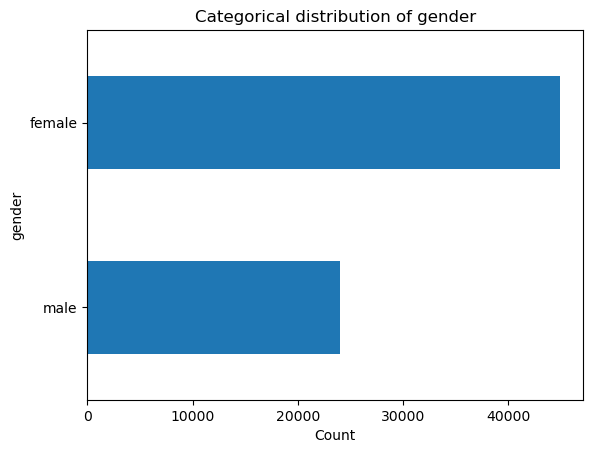

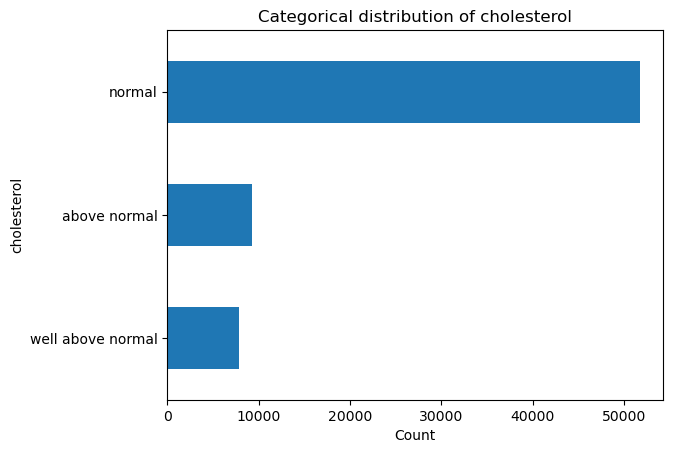

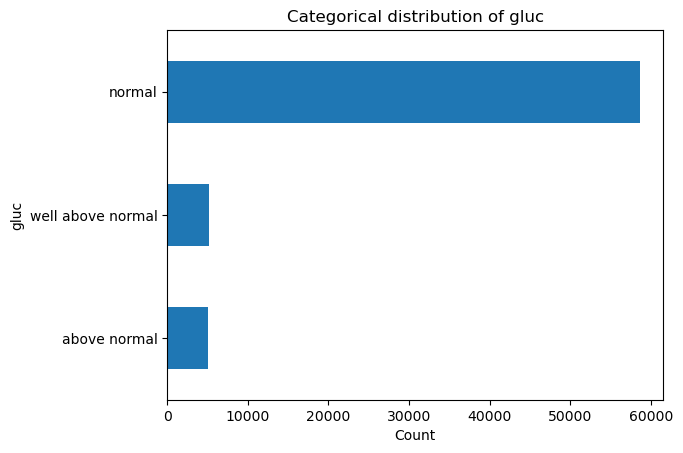

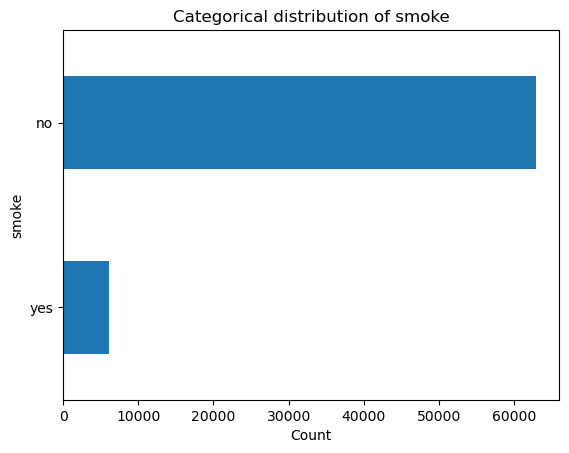

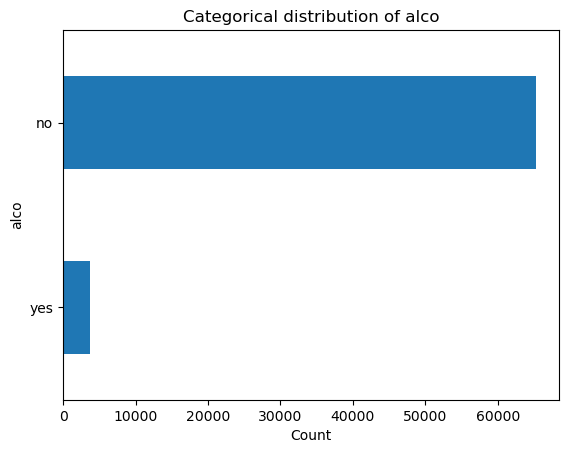

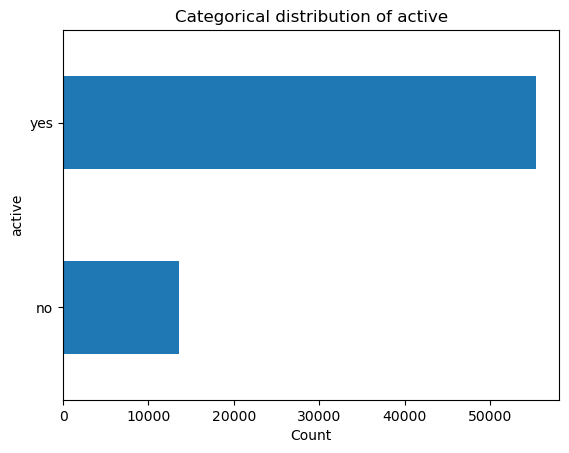

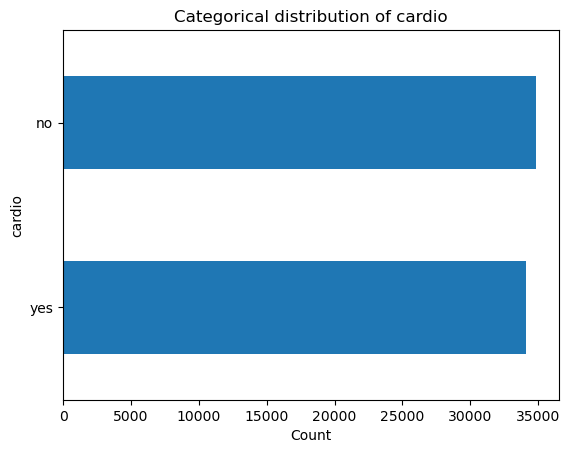

In [35]:
# Iterate over the columns and create a plot for every categorical column
for column in categorical_df:
    categorical_df[column].value_counts().sort_values().plot(kind='barh')
    plt.xlabel('Count')
    plt.title(f"Categorical distribution of {column}")
    plt.show()

In [61]:
#count the values of column `cardio`
cardio_visual['cardio'].value_counts()

cardio
no     34803
yes    34100
Name: count, dtype: int64

We observe that:
* there is with 50% more female than male
* most people have normal cholesterol (~73,5%), and there is 26,5% of patients that have a high cholesterol (15% above normal and 11,5% well above normal)
* most people have normal glucoze (75%), and 15% of people have a high glucoze
* patients have a relatively healthy lifestyle, with only 7% that are smoking, 5% that are drinking alcohol and 20% that have a sedentary lifestyle
* the distribution of having a CVD disease is almost the same, for having a CVD- 50,5% and not having a CVD-49,5%

##### **Distribution of numeric values**

Now, let's look at the distribution of numeric values:

In [43]:
# create a DataFrame for numerical values, beside ID
numeric_df = cardio_visual.select_dtypes(include=['int64', 'float64']).copy()
#Check
numeric_df.head()

,age,height,weight,ap_hi,ap_lo,bmi
0,50,168,62.0,110,80,21.967120
1,55,156,85.0,140,90,34.927679
2,51,165,64.0,130,70,23.507805
3,48,169,82.0,150,100,28.710479
4,47,156,56.0,100,60,23.011177


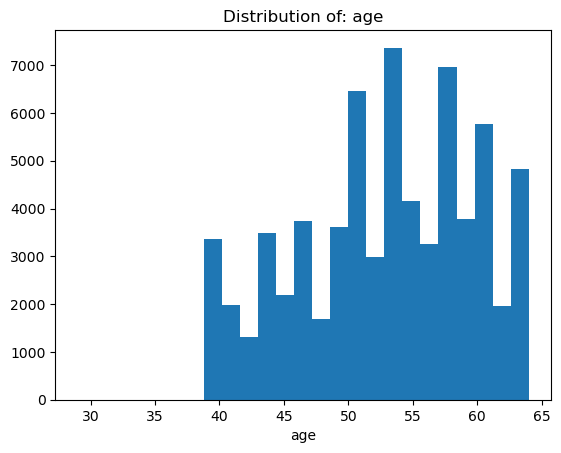

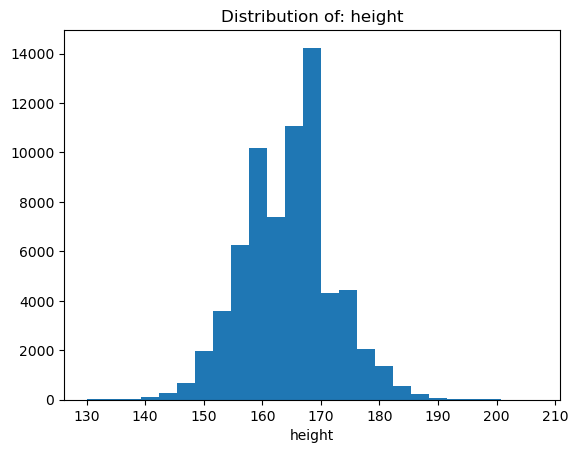

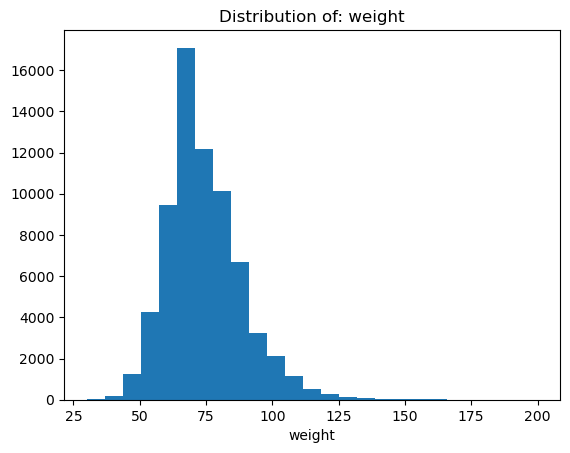

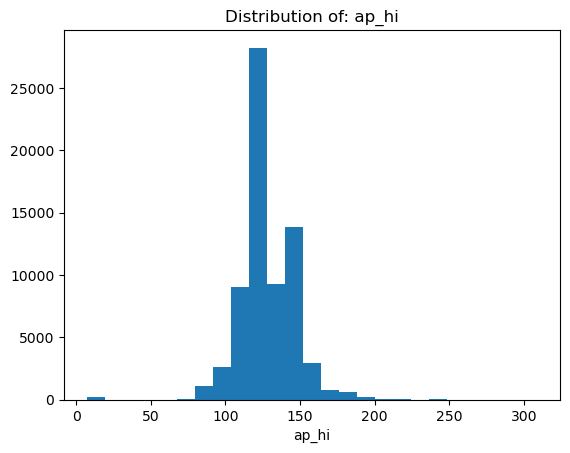

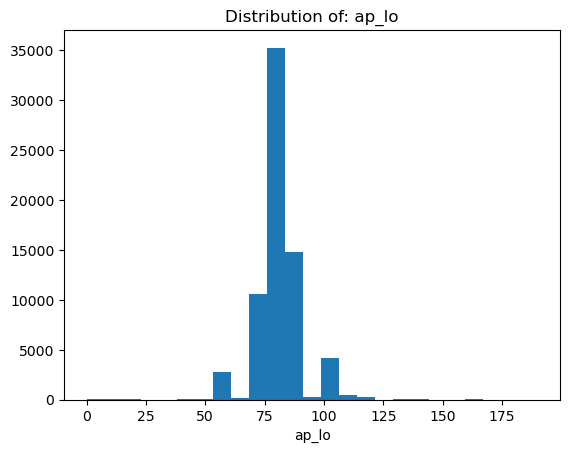

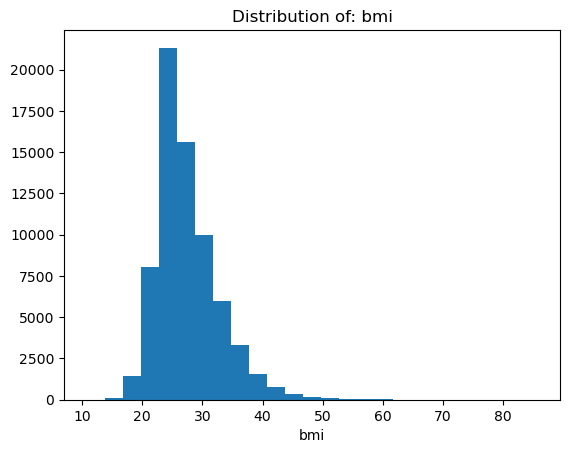

In [33]:
# create a loop for plotting the distribution of numeric columns
for column in numeric_df:
    plt.figure()
    plt.hist(cardio_visual[column], bins=25)
    plt.title(f"Distribution of: {column}")
    plt.xlabel(column)
    plt.show()

We can observe that all numerical values have normal distribution and:
* the age of most patients is between 51-60 years
* the medium height of patients is between 158-168 cm
* the most frequently weight is between 60-80 kg
* most patients have in medium the Systolic blood pressure between 110-150 mmHg
* and Diastolic blood pressure between 70-90 mmHg
* most patients has normal BMI, between 20-23

##### **The relationship between having a cardiovascular disease with other features**

Now, after looking at the distribution of values, we can research the relationship between having a CVD (`cardio`) and other variables: 

***1. The distribution of age, by having a cardiovascular disease***

In [62]:
#create a histogram
px.histogram(cardio_visual, x="age", title="Age of patients, by having a CVD", color='cardio', 
                    labels= {'age': 'Age', 'cardio': 'CVD'}, width=800, height=500, 
                    marginal= 'box', color_discrete_sequence=['lightskyblue', 'salmon'])



We can observe that from 55 years, the proportion between patients who have a CVD and patients that don't have CVD is higher and is rising every year. We can see that at 63 years, more than 72% of patients have a cardiovascular diseease. Therefore, **the oldest is the patient, the higher is the risk of having a cardiovascular disease**. 

***2. The distribution of gender, by having a cardiovascular disease***

In [ ]:
#Create a histogram
px.histogram(cardio_visual, x='gender', color="cardio", barmode='group', 
             color_discrete_sequence=['lightskyblue', 'salmon'], height=500, width=400,
             title='Distribution of the gender by having a CVD')

We observe that 50,5% of males have a CVD, compared with 49,7% for females that have a CVD. Therefore, **males have a higher risk to have a CVD with 0,8%**. 

***3. The distribution of height, weight and bmi, by having a cardiovascular disease***

Let's look at the weight and height of patients, in terms of having or not a cardiovascular disease:

In [59]:
# Set up the Figure 
fig = go.Figure()

# Separate the dataframe by `cardio`
withcvd = cardio_visual[cardio_visual['cardio'] == 'yes']
withoutcvd = cardio_visual[cardio_visual['cardio'] == 'no']

#Create a scatter for every feature
scatter1 = go.Scatter(x=withcvd['weight'],y=withcvd['height'], 
                         mode='markers', name='With CVD')
scatter1.marker.color = 'salmon'

scatter2 = go.Scatter(x=withoutcvd['weight'],y=withoutcvd['height'], 
                         mode='markers', name='Without CVD')
scatter2.marker.color = 'lightskyblue'
scatter2.marker.opacity = 0.4

# Add trace 
fig.add_trace(scatter1)
fig.add_trace(scatter2)

# Create the layout and add it to the figure
chart_layout = go.Layout(width=800, height=600, 
                        title='The distribution between weight, height and presence of a CVD',
                        xaxis_title='Weight', yaxis_title='Height')
fig.update_layout(chart_layout)

fig.show()

We see that the scatter plots are almost the same, only the scatter plot for patients that has a CVD seems to be bigger. 

And now, let's look at the Body Mass Index of patients, in terms of having or not a CVD:

In [88]:
#create a histogram
px.histogram(cardio_visual, x="bmi", title="The distribution of BMI, by having a CVD", 
            color='cardio', width=700, height=700, marginal= 'box',
            labels= {'bmi': 'BMI', 'cardio': 'CVD'},  
            color_discrete_sequence=['lightskyblue', 'salmon'])

There we can see more clearly that the patients without a CVD have a medium BMI of 23.38-28.73, and the patients with a CVD have a medium BMI of 24.46-31.47. As we know, a healthy BMI is considered to be between 18.5-24.9. Therefore, overweight and obese patients are more at risk to have a cardiovascular disease. **The higher is the BMI, the higher is the risk of having a CVD**. 

***4. The relationship between having a CVD and blood pressure***

In [73]:
# Set up the Figure 
fig = go.Figure()

# Separate the dataframe by `cardio`
withcvd = cardio_visual[cardio_visual['cardio'] == 'yes']
withoutcvd = cardio_visual[cardio_visual['cardio'] == 'no']

#Create a scatter for every feature
scatter1 = go.Scatter(x=withcvd['ap_lo'],y=withcvd['ap_hi'], 
                         mode='markers', name='With CVD')
scatter1.marker.color = 'salmon'
scatter1.marker.opacity = 0.6

scatter2 = go.Scatter(x=withoutcvd['ap_lo'],y=withoutcvd['ap_hi'], 
                         mode='markers', name='Without CVD')
scatter2.marker.color = 'lightskyblue'
scatter2.marker.opacity = 0.4

# Add trace 
fig.add_trace(scatter1)
fig.add_trace(scatter2)

# Add vertical line for normal diastolic blood pressure
normal_aplo1 = 65 
normal_aplo2 = 80
fig.add_shape(type="line", x0=normal_aplo1, y0=0, x1=normal_aplo1, y1=300,
              line=dict(color="gold", width=2, dash="dash"))
fig.add_shape(type="line", x0=normal_aplo2, y0=0, x1=normal_aplo2, y1=300,
              line=dict(color="gold", width=2, dash="dash"))

# Add horizontal line for normal systolic blood pressure
normal_aphi1 = 100
normal_aphi2 = 120
fig.add_shape(type="line", x0=0, y0=normal_aphi1, x1=200, y1=normal_aphi1,
              line=dict(color="gold", width=2, dash="dash"))
fig.add_shape(type="line", x0=0, y0=normal_aphi2, x1=200, y1=normal_aphi2,
              line=dict(color="gold", width=2, dash="dash"))

# Create the layout and add it to the figure
chart_layout = go.Layout(width=800, height=600, 
                        title='The relationship between blood pressure and presence of a CVD',
                        xaxis_title='Diastolic blood pressure', yaxis_title='Systolic blood pressure')
fig.update_layout(chart_layout)

fig.show()

We can observe that usually, patients with normal blood pressure are at lower risk to have a CVD and **the highest is the blood pressure, the highest is the risk to have a CVD**. 

***5. The relationship between cholesterol and the presence of a CVD***

In [90]:
#create a histogram
px.histogram(cardio_visual, x='cholesterol', color="cardio", barmode='group', 
             color_discrete_sequence=['lightskyblue', 'salmon'], 
             height=700, width=600, labels= {'cardio': 'CVD'},
             title= 'The relationship between cholesterol and having a CVD')

We observe that the risk of having a CVD is lower if the cholesterol is normal. The risk is increasing if the cholesterol is above normal. When the cholesterol is well above normal, the risk is the highest (76.3%). 

***6. The relationship between the glucose and having a CVD***

In [91]:
#create a histogram
px.histogram(cardio_visual, x='gluc', color="cardio", barmode='group', 
             color_discrete_sequence=['lightskyblue', 'salmon'], 
             height=700, width=600, labels= {'gluc': 'Glucose', 'cardio': 'CVD'},
             title= 'The relationship between glucose and having a CVD')

We can observe that the glucose is like cholesterol, the highest is glucose in the blood, the highest is the risk of having a CVD. 

***7. The relationship between smoking, and having a CVD***

In [92]:
#create a histogram
px.histogram(cardio_visual, x='smoke', color="cardio", barmode='group', 
             color_discrete_sequence=['lightskyblue', 'salmon'], 
             height=500, width=500, labels= {'smoke': 'Smoking', 'cardio': 'CVD'},
             title= 'The relationship between smoking and having a CVD')

We can see that there is not a big difference between the patients that smoke or don't smoke, in terms of having a cardiovascular disease. We can assume that, based on this graph, smoking don't have a big influence on having a CVD.

***8. The relationship between drinking alcohol and having a CVD***

In [96]:
#create a histogram
px.histogram(cardio_visual, x='alco', color="cardio", barmode='group', 
             color_discrete_sequence=['lightskyblue', 'salmon'], 
             height=500, width=600, labels= {'alco': 'Drinking alcohol', 'cardio': 'CVD'},
             title= 'The relationship between drinking alcohol and having a CVD')

We see that drinking alcohol also doesn't have a big influence on having or not a CVD. 

***9. The relationship between being active and having a CVD***

In [95]:
#create a histogram
px.histogram(cardio_visual, x='active', color="cardio", barmode='group', 
             color_discrete_sequence=['lightskyblue', 'salmon'], 
             height=500, width=520, labels= {'active': 'Being active', 'cardio': 'CVD'},
             title= 'The relationship between being active and having a CVD')

We observe that the patients that have a more sedentary lifestyle, have a higher risk of having a CVD (with 7.7%). 

##### **3. Initial patern discovery**

After doing preliminary EDA, we observed some paterns between having a cardiovascular disease and other features:
* The older patients have a higher risk of having a CVD
* Men has higher risk of having a CVD, compared to women
* Being overweight and obese, makes you more prone to having a cardiovascular disease
* Patients with a high blood pressure are more at risk to have a CVD
* Having high cholesterol and glucose in the blood, increases the risk of having a CVD
* Smoking and drinking alcohol doesn't influence too much the probability of having a CVD
* Having an active lifestyle decreases the risk of having a CVD

Now, let's look at the correlation map and see if we can find some key insights: 

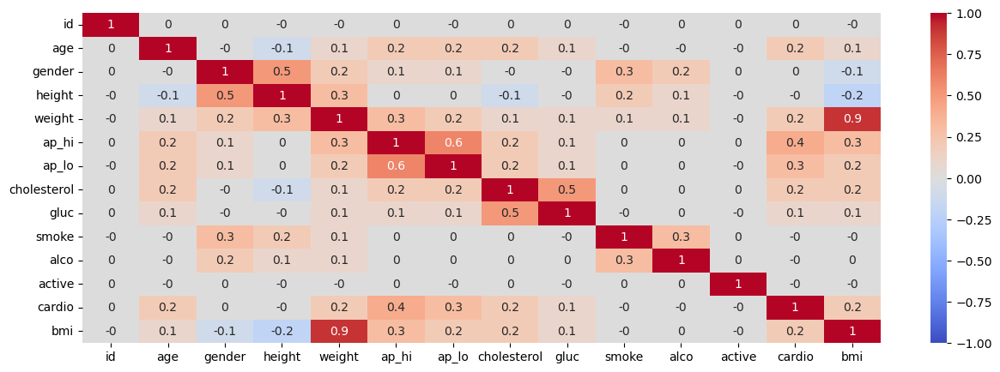

In [107]:
plt.figure(figsize=(15, 5))
sns.heatmap(cardio_df.corr(numeric_only=True).round(1), cmap="coolwarm", vmax=1.0, vmin=-1.0, annot=True)
plt.show()

We can ignore the correlation between weight and BMI, systolic and diastolic blood pressure, as we know that they are related with each other. 

Therefore, for further analysis, we can look at:
* the influence of age on blood pressure and cholesterol
* the influence of BMI on blood pressure and cholesterol
* the relationship between glucose and cholesterol
* the distribution of BMI/ weight, by gender
* the relationship between gender and if the patient is smoking, drinking alcohol

In **conclusion**, we could see that the features that influence the most the probability of having a cardiovascular disease are:
* age
* gender
* BMI or weight
* blood pressure

Other characteristics that affect the health of patients are:
* having a high cholesterol and glucose
* having a sedentary lifestyle


##### **4. Further steps**

1) After doing our preliminary EDA, we will look further at the relationship between various features, to see if they will afect our model in the future. 
2) We will prepare our data for modeling and do some statistical analysis
3) We will use different machine learning techniques (logistic regression, decision tree, etc.) to build the best model that will resolve our problem: to predict if a person will have a cardiovascular disease
4) After choosing the best model, we will do some reccomendation for the person, on how to minimize the risk of having a CVD. In order to do that: 
    * we will use another dataset that contains different activities/ exercises and the number of calories that are burned
    * we will gather more data to this dataset
    * we will calculate and add the daily calories count that the person should eat, to normalize his weight and BMI
    * we will add more reccomendation, based on what features are more at risk for the patient
5) We will make an user friendly web app, so we can check our model with real data 
 